#**DỰ ĐOÁN CHỮ CÁI KÝ HIỆU BẰNG THUẬT TOÁN MÁY HỌC**


**1. Giới thiệu bài toán**

- Ngôn ngữ ký hiệu hay ngôn ngữ dấu hiệu, thủ ngữ là ngôn ngữ dùng những biểu hiện của bàn tay thay cho âm thanh của tiếng nói. Ngôn ngữ ký hiệu của người khiếm thính được tạo ra nhằm giúp họ có thể giao tiếp với nhau trong cộng đồng của mình và tiếp thu tri thức của xã hội. Ngôn ngữ ký hiệu còn là một thước đo để người bình thường có thể hiểu và giao tiếp với người khiếm thính. Mỗi ngôn ngữ đều có bảng chữ cái riêng, ngôn ngữ ký hiệu cũng thế. Ngôn ngữ ký hiệu đa dạng với từng nước và đôi khi khác nhau ở từng vùng miền ở một nước, nhưng đa số là tương tự nhau.

- Việc giao tiếp giữa người bình thường và người khiếm thính luôn có những có những khó khăn nhất định. Ngôn ngữ ký hiệu còn được chia ra hai dạng đó là  tĩnh và động (cần động tác). Đồ án sử dụng thuật toán máy học nhận dạng hình ảnh ký hiệu bàn tay, nhằm dự đoán thuộc ký hiệu nào trong bảng chữ cái.


**2. Ứng dụng và mục tiêu**

-  Trên thế giới, đã có nhiều mô hình nghiên cứu phát triển các dịch vụ thông dịch ngôn ngữ ký hiệu và các sản phẩm công nghệ để hỗ trợ người khiếm thính như: [MotionSavvy tablet](https://techcrunch.com/2014/06/06/motionsavvy-is-a-tablet-app-that-understands-sign-language/), [Tencent YouTu Lab platform](https://www.youtube.com/watch?v=XYnwcIzZBGQ), ...
- Mục tiêu của đồ án là đưa ra kết quả chữ cái được dự đoán sau khi đưa vào một hình ảnh ký hiệu bàn tay.
- Hướng phát triển: bổ sung việc dự đoán những ngôn ngữ ký hiệu động.

<figure>
<center>
<img src='https://drive.google.com/uc?export=view&id=1eQ4rzdtlGltvmJigScrEA_eG65teriXE'/>
<figcaption>Bảng chữ cái ký hiệu Việt Nam</figcaption></center>
</figure>




**Authorize drive**

In [64]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [65]:
cd /content/drive/My Drive/ML

/content/drive/My Drive/ML


## **Import library**

In [2]:
# import the necessary packages
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from imutils import paths
import numpy as np
import cv2
import math
import os
import imutils
import itertools
from scipy.spatial import distance as dist
from __future__ import print_function
import matplotlib.pyplot as plt
import pickle
%matplotlib inline



---
### Global variables


In [3]:
img_dir = "/content/drive/My Drive/ML/dataset/croped"
train_dir = "/content/drive/My Drive/ML/dataset/train"
IMG_HEIGHT = 90
IMG_WEIGHT = 90
data = []
labels = []

### Global function

In [4]:
def order_points(pts):
	# sort the points based on their x-coordinates
	xSorted = pts[np.argsort(pts[:, 0]), :]
	# grab the left-most and right-most points from the sorted
	# x-roodinate points
	leftMost = xSorted[:2, :]
	rightMost = xSorted[2:, :]
	# now, sort the left-most coordinates according to their
	# y-coordinates so we can grab the top-left and bottom-left
	# points, respectively
	leftMost = leftMost[np.argsort(leftMost[:, 1]), :]
	(tl, bl) = leftMost
	# now that we have the top-left coordinate, use it as an
	# anchor to calculate the Euclidean distance between the
	# top-left and right-most points; by the Pythagorean
	# theorem, the point with the largest distance will be
	# our bottom-right point
	D = dist.cdist(tl[np.newaxis], rightMost, "euclidean")[0]
	(br, tr) = rightMost[np.argsort(D)[::-1], :]
	# return the coordinates in top-left, top-right,
	# bottom-right, and bottom-left order
	return np.array([tl, tr, br, bl], dtype="float32")

In [5]:
def four_point_transform(image, pts):
	# obtain a consistent order of the points and unpack them
	# individually
	rect = order_points(pts)
	(tl, tr, br, bl) = rect
	# compute the width of the new image, which will be the
	# maximum distance between bottom-right and bottom-left
	# x-coordiates or the top-right and top-left x-coordinates
	widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
	widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
	maxWidth = max(int(widthA), int(widthB))
	# compute the height of the new image, which will be the
	# maximum distance between the top-right and bottom-right
	# y-coordinates or the top-left and bottom-left y-coordinates
	heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
	heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
	maxHeight = max(int(heightA), int(heightB))
	# now that we have the dimensions of the new image, construct
	# the set of destination points to obtain a "birds eye view",
	# (i.e. top-down view) of the image, again specifying points
	# in the top-left, top-right, bottom-right, and bottom-left
	# order
	dst = np.array([
		[0, 0],
		[maxWidth - 1, 0],
		[maxWidth - 1, maxHeight - 1],
		[0, maxHeight - 1]], dtype = "float32")
	# compute the perspective transform matrix and then apply it
	M = cv2.getPerspectiveTransform(rect, dst)
	warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
	# return the warped image
	return warped

In [6]:
#Hàm lấy bounding box của contour lớn nhất
def getLargestContourBox(image, thresh_hold):
  # load our input image, convert it to grayscale, and blur it slightly
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  gray = cv2.GaussianBlur(gray, (7, 7), 0)
  _, binary = cv2.threshold(gray, thresh_hold, 255, cv2.THRESH_BINARY)
  # find contours in the edge map
  cnts = cv2.findContours(binary.copy(), cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE)
  cnts = imutils.grab_contours(cnts)
  # Top 5 contour có diện tích lớn nhất
  area_cnt = [cv2.contourArea(cnt) for cnt in cnts]
  area_sort = np.argsort(area_cnt)[::-1]
  area_sort[:5]
  # Vẽ bounding box cho contours có diện tích lớn thứ 1
  c = cnts[area_sort[0]]
  colors = ((0, 0, 255), (240, 0, 159), (255, 0, 0), (255, 255, 0))
  # compute the rotated bounding box of the contour, then
  # draw the contours
  box = cv2.minAreaRect(c)
  box = cv2.cv.BoxPoints(box) if imutils.is_cv2() else cv2.boxPoints(box)
  box = np.array(box, dtype="int")
  return box, binary

## **Dữ liệu**




### **1. Mô tả dữ liệu**
* Ngôn ngữ kí hiệu tĩnh Việt Nam bao gồm 25 kí tự bao gồm 23 kí tự Việt Nam không bao gồm F, J, W, Z và 2 kí hiệu dấu 'râu' và 'mũ'.

* Bộ dữ liệu đồ án bao gồm 22 kí tự không bao gồm kí tự 'Đ', 'J', 'W', 'Z', 'râu', 'mũ'. 

* Mỗi kí tự bao gồm 50 hình ảnh đều được chụp bằng điện thoại, dưới ánh đèn Flash và nền đen.

* Kích thước bộ dữ liệu bao gồm 22 * 50 = 1100 hình ảnh




In [70]:
# Xây dựng hàm để biểu diễn hình ảnh
def display_raw_image(display_class, dir, col_plot = 5):
  plt.figure(figsize = (10,10))
  row_plot = int(len(display_class) / col_plot)
  if (len(display_class) % col_plot != 0 ): row_plot += 1
  index = 1
  for _ in range(row_plot):
    if (index > len(display_class)): break;
    for _ in range(col_plot):
      if (index > len(display_class)): break;
      class_name = display_class[index - 1]
      class_dir = '{dir}/{class_name}'.format(dir=dir,class_name=class_name)
      img_path = '{0}/{1}'.format(class_dir, os.listdir(class_dir)[0])
      print(img_path)
      img = cv2.imread(img_path)
      plt.subplot(row_plot, col_plot, index)
      plt.title(class_name)
      plt.imshow(img)
      plt.axis('off')
      index = index + 1
  plt.show()

/content/drive/My Drive/ML/dataset/train/A/IMG_2346.JPG
/content/drive/My Drive/ML/dataset/train/Q/IMG_2866.JPG
/content/drive/My Drive/ML/dataset/train/P/IMG_2826.JPG
/content/drive/My Drive/ML/dataset/train/G/IMG_2168.JPG
/content/drive/My Drive/ML/dataset/train/Y/IMG_3301.JPG
/content/drive/My Drive/ML/dataset/train/L/IMG_2632 (1).JPG


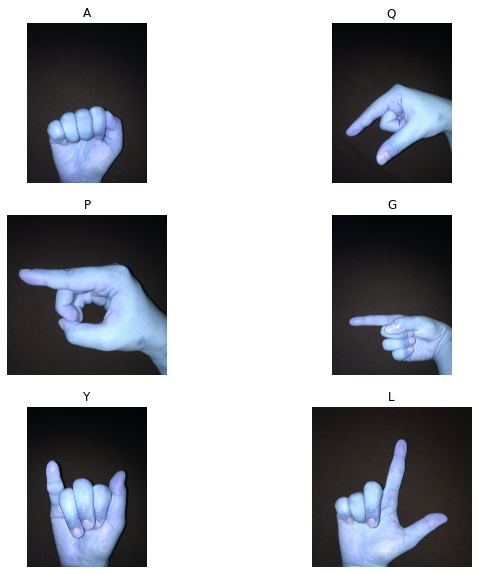

In [71]:
#Show hình ảnh của những chữ cái bên dưới
display_class = ['A', 'Q', 'P', 'G', 'Y', 'L']
col_class = 2
display_raw_image(display_class, train_dir, col_class)

### **2. Tiền xử lý dữ liệu**

Hình ảnh thô ở trên bao gồm những thông tin không cần thiết như phần rìa đen của background. Mục đích của quá trình xử lý là lấy ra thông tin cần thiết của bàn tay.
<figure>
<center>
<img src='https://drive.google.com/uc?export=view&id=1QLnVfdK0dtUUsAxuukXWQKxTmj2eKf4q'/>
<figcaption>Các bước xử lý dữ liệu</figcaption></center>
</figure>

Quá trình xử lý bao gồm 2 bước:
- Bước 1:  Ảnh bằng cách đưa về ảnh gray -> lọc nhiễu bằng bộ lọc Gausian -> áp dụng thresh hold để chuyển về ảnh binary (vì màu da và màu nền đối nhau). Tìm contour lớn nhất của ảnh binary và bounding box tương ứng (khung màu xanh của hình Countour image ở trên).
- Bước 2: Vì sẽ có một số bounding box có góc xoay, nên cần thực hiện một số phép biến đổi hình học để đưa về góc thẳng. 

<figure>
<center>
<img src='https://drive.google.com/uc?export=view&id=1HswEEzdCSAUoMXrzgfLDBcv60GqXUZnv'/>
<figcaption>Áp dụng phép biến đổi hình học</figcaption></center>
</figure>

Hình sau khi thực hiện các phép biến đổi, thu được hình chứa thông tin cần thiết của ảnh gốc. Để dễ dàng cho việc tính toán sau này, quá trình xử này được thực hiện ở [file colab](https://colab.research.google.com/drive/18iVInC5O7qi9uAWoOWpzPj7J7-txv9Of?usp=sharing) và hình ảnh của các kí tự sau khi xử lí được lưu vào thư mục [croped](https://drive.google.com/drive/folders/1X7P4noJyEeRBEJ_ysoh_9YQVhFTB92Ho?usp=sharing)

## **Load image**

Sau khi cắt ảnh dựa vào bounding box thì mỗi ảnh sẽ có size khác nhau. Để dễ dàng cho việc rút trích feature và train mô đồ, sẽ tiến hành resize ảnh về (90x90)

In [72]:
def getData(img_dir, debug = False):
  data = []
  labels = []
  listDir = os.listdir(img_dir)
  for (i, label) in enumerate(listDir):
    class_dir = img_dir + '/' + label
    first_index = True
    for img_name in os.listdir(class_dir):
      img_path = class_dir + '/' + img_name
      origin_image = cv2.imread(img_path)
      image = origin_image.copy()
      image = cv2.resize(image, (IMG_HEIGHT, IMG_WEIGHT))
      data.append(image)
      labels.append(label)
      if (debug == True and first_index == True and i % 2 == 0):
        print(label)
        plt.figure(figsize=(8, 8))
        plt.subplot(121)
        plt.title('Croped image')
        plt.imshow(origin_image)
        plt.axis('off')
        plt.subplot(122)
        plt.title('Resize image')
        plt.imshow(image)
        plt.axis('off')
        plt.show()
        first_index = False
    if (i % 2 == 0):
      print("[INFO] processed class {}/{}".format(i, len(listDir)))
  return (data, labels)

I


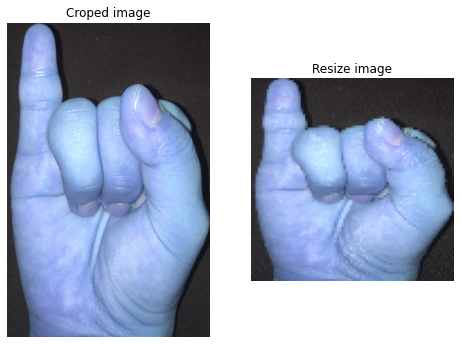

[INFO] processed class 0/22
K


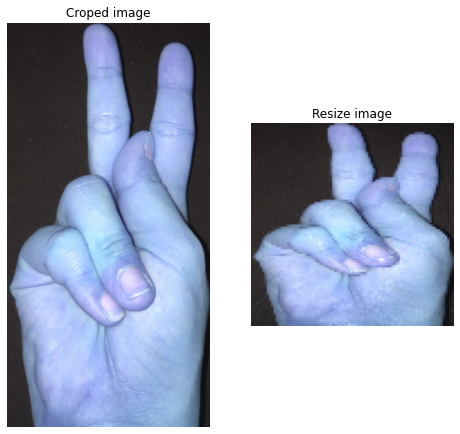

[INFO] processed class 2/22
D


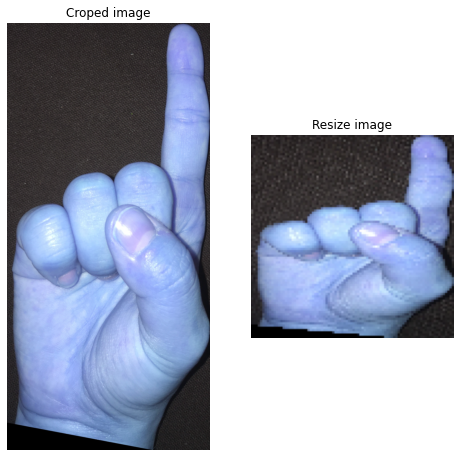

[INFO] processed class 4/22
H


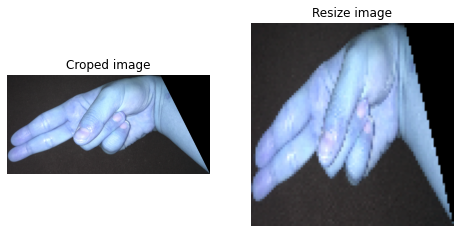

[INFO] processed class 6/22
B


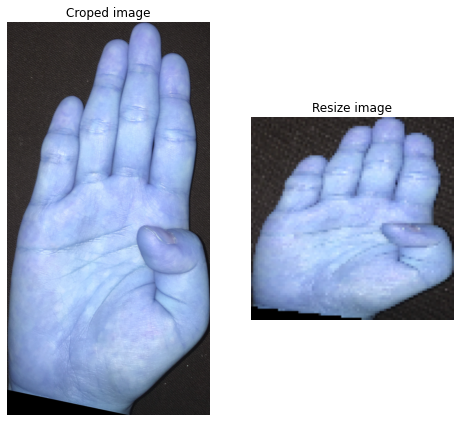

[INFO] processed class 8/22
P


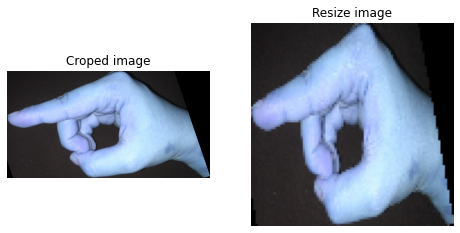

[INFO] processed class 10/22
Q


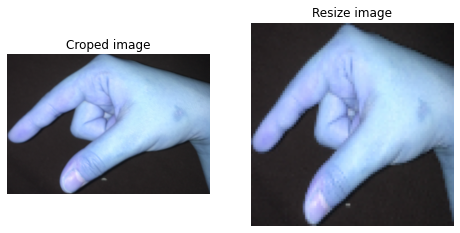

[INFO] processed class 12/22
V


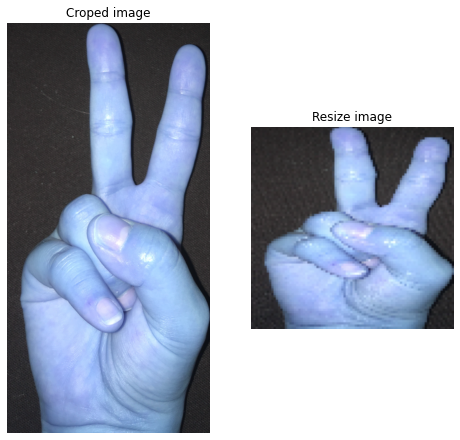

[INFO] processed class 14/22
S


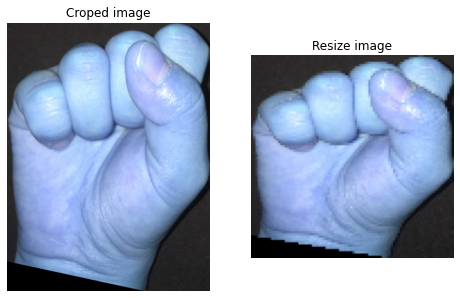

[INFO] processed class 16/22
U


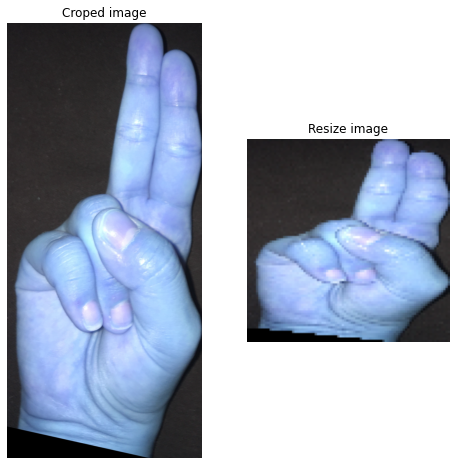

[INFO] processed class 18/22
X


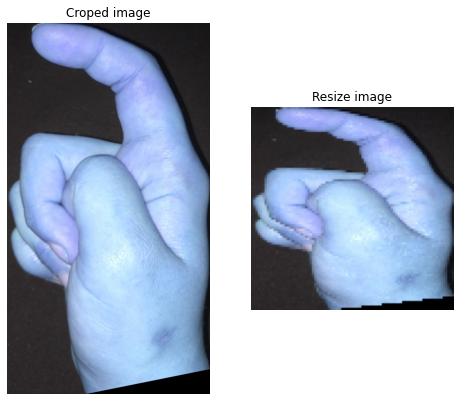

[INFO] processed class 20/22


In [73]:
data, labels = getData(img_dir, True)

In [74]:
data = np.asarray(data)
print(data.shape)

(1100, 90, 90, 3)


## **Rút trích đặc trưng**

- Màu da mỗi người là khác nhau, và có người tay to, tay nhỏ => không xét màu da, kích thước bàn tay là đặc trưng
- Đa số mọi người đều thuận tay phải, nên chọn tay phải là một đặc trưng cho bài toán.
- Đa số màu da của người là màu sáng (trừ người da đen) so với nền màu tối, và hình dáng biểu hiện ngôn ký hiệu là tương tự => Xem xét chọn hình dáng, cạnh của bàn tay là đặc trưng.

In [11]:
def get_Laplacian_image(image):
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  gray = cv2.medianBlur(gray,5)
  # _, binary = cv2.threshold(gray, 50, 255, cv2.THRESH_BINARY)
  edged = cv2.Laplacian(gray,cv2.CV_64F)
  #edged = cv2.Canny(gray, 100, 200)
  return edged

In [19]:
def getFeatureVector(data, type_feature='edge', debug=False):
  features = []
  for (i,image) in enumerate(data):
    if (type_feature == 'edge'):
      image_Laplacian = get_Laplacian_image(image)
      e_feature = image_Laplacian.flatten()
      if (debug == True and i % 100 == 0):
        plt.figure(figsize=(8, 8))
        plt.subplot(121)
        plt.title('Croped image')
        plt.imshow(image)
        plt.axis('off')
        plt.subplot(122)
        plt.title('Laplacian image')
        plt.imshow(image_Laplacian, 'gray')
        plt.axis('off')
        plt.show()
    features.append(e_feature)
  return features

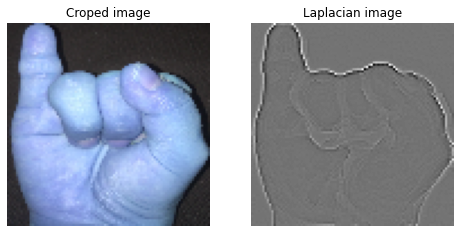

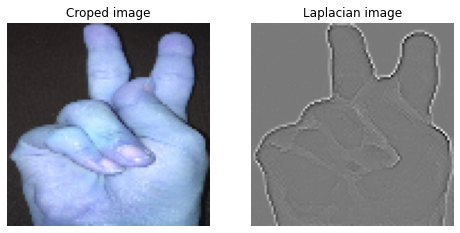

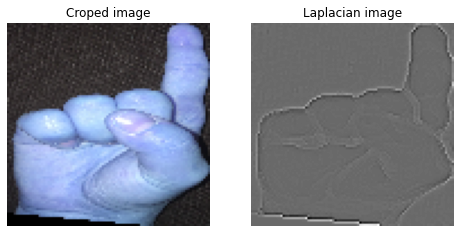

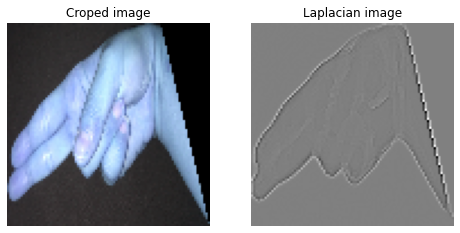

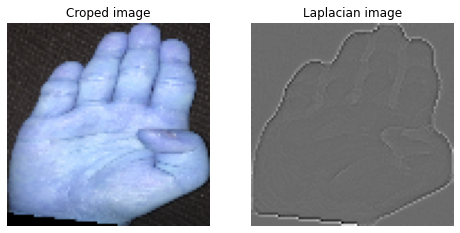

...

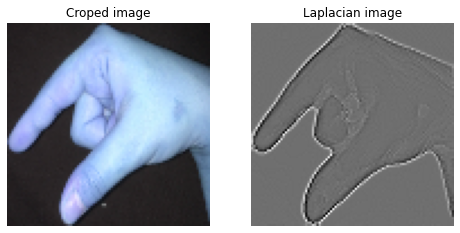

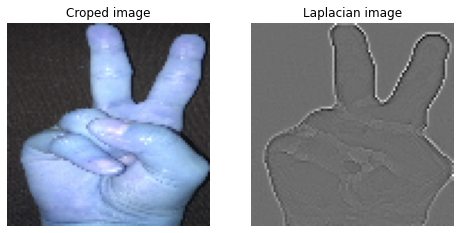

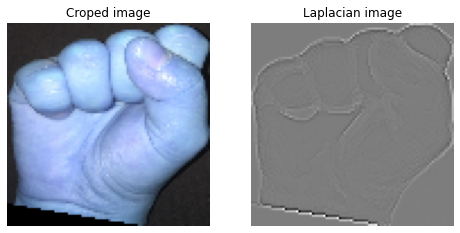

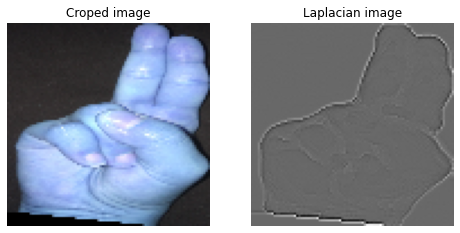

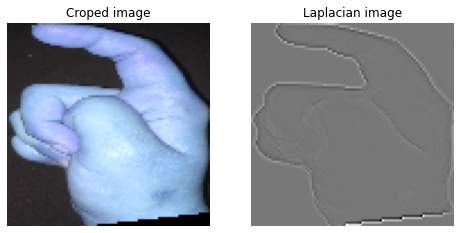

In [77]:
features = getFeatureVector(data,'edge', True)


In [78]:
print(len(features))
print(features[0].shape)

1100
(8100,)


**Tương ứng với 1100 ảnh, ta sẽ thu được 1100 feature-vector. Mỗi vector có số chiều 8100.**

## **Phân chia dữ liệu**
- Dùng dữ liệu vừa được rút trích đặc trưng ở trên, để xây dựng model. Trong đó 80% dùng để train các thuật toán và 20% để thẩm định kết quả.

- Dữ liệu ở folder [test](https://drive.google.com/drive/folders/1gMaYtXdFYUH5XTROFvnXIOWhhwDOClyz?usp=sharing), bao gồm 5 ảnh cho từng 22 folder đại diện các ký tự, là bộ dữ liệu thô cần phải được tiền xử lý và rút trích đặc trưng, để kiểm tra hiệu quả của thuật toán tốt nhất chọn được.

In [79]:
le = LabelEncoder()
labels_tranform = le.fit_transform(labels)
(trainData, testData, trainLabels, testLabels) = train_test_split(
  np.array(features), labels_tranform, test_size=0.2, random_state=42)

In [80]:
print(len(trainData))
print(len(testData))

880
220


## **Train Model**
Các thuật toán máy học được sử dụng từ thư viện **scikit-learn**.

*Hàm bên dưới đây dùng để biểu diễn confusion matrix*

In [51]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize = (8,8))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

### **1. K-Nearest-Neighbors**
**K-Nearest-Neighbors (k-NN):** là một thuật toán máy học đơn giản và dễ tiếp cận, nó được xây dựng bằng cách lưu trữ bộ dữ liệu train và thực hiện dự đoán một dữ liệu mới dựa theo k điểm dữ liệu trên tập train gần nó nhất.

In [96]:
# Default n_neighbors = 5
knn = KNeighborsClassifier()
knn.fit(trainData, trainLabels)
predictions = knn.predict(testData)
print("Accuracy on training set: {}%".format(100*accuracy_score(trainLabels, sr.predict(trainData))))
print("Accuracy on test set: {}%".format(100*accuracy_score(testLabels, predictions.tolist())))
print(classification_report(testLabels, predictions,
  target_names=le.classes_))

Accuracy on training set: 100.0%
Accuracy on test set: 40.45454545454545%
              precision    recall  f1-score   support

           A       0.08      0.75      0.14        12
           B       1.00      0.78      0.88         9
           C       1.00      0.07      0.12        15
           D       0.58      0.78      0.67         9
           E       0.71      0.56      0.63         9
           G       1.00      0.12      0.22         8
           H       1.00      0.08      0.14        13
           I       1.00      0.33      0.50         9
           K       1.00      0.10      0.18        10
           L       0.00      0.00      0.00         9
           M       0.42      0.73      0.53        11
           N       0.78      0.70      0.74        10
           O       1.00      0.17      0.29        12
           P       1.00      0.07      0.12        15
           Q       1.00      0.14      0.25         7
           R       0.86      0.86      0.86         7
       

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


- Có thể thấy f1-score khá thấp: 0.4
- Đa số các class có presicion và recall chênh lệch khá cao trừ một số class (B,D,R,N,S,T,U)
- Class L có kết quả tệ nhất f1-score: 0

### **2. LOGISTIC REGRESSION**
**Logistic Regresion:** là một model tuyến tính trong machine learning. Các thuật toán tuyến tính thường được sử dụng cho bài toán phân loại 2 lớp. Tuy nhiên để mở rộng cho những bài toán phân loại nhiều lớp hơn, kỹ thuật được sử dụng nhiều nhất one-vs-rest. 

Bên cạnh đó có một phương pháp mở rộng của Logistic Regression là **Softmax Regression** được sử dụng rộng rãi và đạt hiệu quả cao trong nhiều bài toán. Đồ án sẽ so sánh kết quả giữa 2 cách tiếp cận.

####**2.1 one-vs-rest (OvR)**

In [97]:
ovr = LogisticRegression(multi_class='ovr', solver='liblinear')
ovr.fit(trainData, trainLabels)
predictions = ovr.predict(testData)
print("Accuracy on training set: {}%".format(100*accuracy_score(trainLabels, sr.predict(trainData))))
print("Accuracy on test set: {}%".format(100*accuracy_score(testLabels, predictions.tolist())))
print(classification_report(testLabels, predictions,
  target_names=le.classes_))

Accuracy on training set: 100.0%
Accuracy on test set: 81.81818181818183%
              precision    recall  f1-score   support

           A       0.57      0.67      0.62        12
           B       0.82      1.00      0.90         9
           C       1.00      0.87      0.93        15
           D       0.90      1.00      0.95         9
           E       1.00      0.89      0.94         9
           G       1.00      0.25      0.40         8
           H       0.64      0.54      0.58        13
           I       0.71      0.56      0.63         9
           K       1.00      0.90      0.95        10
           L       1.00      1.00      1.00         9
           M       0.53      0.82      0.64        11
           N       0.67      1.00      0.80        10
           O       0.92      1.00      0.96        12
           P       0.85      0.73      0.79        15
           Q       0.67      0.57      0.62         7
           R       1.00      1.00      1.00         7
       

- Accuracy cao: 81.82%
- f1-score cao: 0.82
- Một số class có f1-score thấp so với các class còn lại: A (0.62), G(0.4), H(0.58), I(0.63), M(0.64), Q(0.62)
- Class Y, L có f1-score cao nhất: 1

####**2.2 Softmax Regression**

In [98]:
sr = LogisticRegression(multi_class='multinomial', solver='lbfgs')
sr.fit(trainData, trainLabels)
predictions = sr.predict(testData)
print("Accuracy on training set: {}%".format(100*accuracy_score(trainLabels, sr.predict(trainData))))
print("Accuracy on test set: {}%".format(100*accuracy_score(testLabels, predictions.tolist())))
print(classification_report(testLabels, predictions,
  target_names=le.classes_))

Accuracy on training set: 100.0%
Accuracy on test set: 82.27272727272728%
              precision    recall  f1-score   support

           A       0.53      0.67      0.59        12
           B       0.90      1.00      0.95         9
           C       1.00      0.87      0.93        15
           D       0.90      1.00      0.95         9
           E       1.00      0.89      0.94         9
           G       0.67      0.25      0.36         8
           H       0.73      0.62      0.67        13
           I       0.71      0.56      0.63         9
           K       0.90      0.90      0.90        10
           L       1.00      1.00      1.00         9
           M       0.60      0.82      0.69        11
           N       0.67      1.00      0.80        10
           O       0.92      1.00      0.96        12
           P       0.79      0.73      0.76        15
           Q       0.80      0.57      0.67         7
           R       0.88      1.00      0.93         7
       

- Accuracy cao: 82.27%
- f1-score cao: 0.82
- Một số class có f1-score thấp so với các class còn lại: A (0.59), G(0.36), H(0.67), I(0.63), M(0.69), Q(0.67)
- Class Y, L có f1-score cao nhất: 1

####**2.3 Đánh giá**
Nhìn chung, dựa vào kết quả dự đoán của tất cả model thì KNN có kết quả thấp nhất, trong khi đó Softmax Regression và OvR có kết quả gần giống nhau. Ký tự G có hiệu quả dự đoán thấp nhất ở cả Softmax Regression và OvR.

## **Tinh chỉnh tham số**

###**1. K-Nearest-Neighbors**

In [99]:
training_accuracy = []
test_accuracy = []

neighbors_settings = range(1, 22, 2)

for n_neighbors in neighbors_settings:
  knn_tuning = KNeighborsClassifier(n_neighbors=n_neighbors)
  knn_tuning.fit(trainData, trainLabels)

  # Lưu lại score
  training_accuracy.append(knn_tuning.score(trainData, trainLabels))
  test_accuracy.append(knn_tuning.score(testData, testLabels))

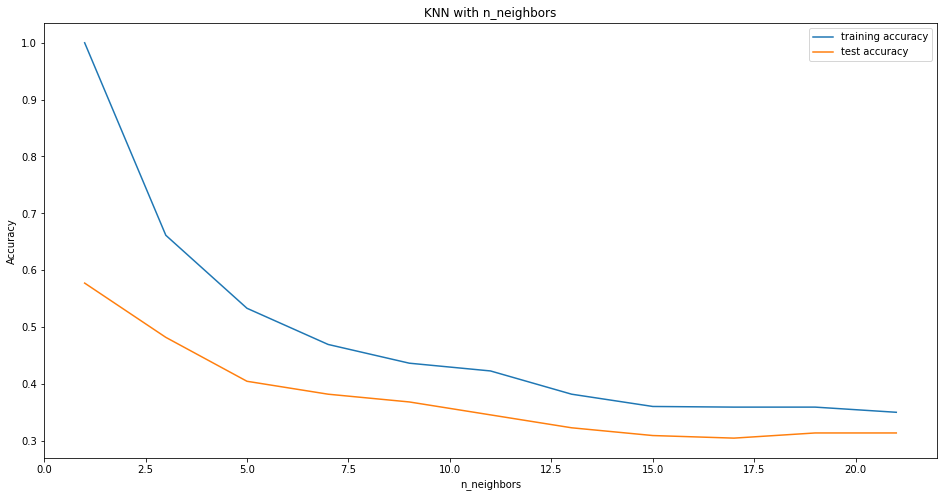

In [106]:
plt.figure(figsize=(16,8))
plt.plot(neighbors_settings, training_accuracy, label="training accuracy")
plt.plot(neighbors_settings, test_accuracy, label="test accuracy")
plt.title("KNN with n_neighbors")
plt.ylabel("Accuracy")
plt.xlabel("n_neighbors")
plt.legend()

In [108]:
n_neighbors = range(15, 22, 1)
metric = ['euclidean', 'manhattan']

knn_tuning = KNeighborsClassifier()
grid = dict(n_neighbors=n_neighbors, metric=metric)
grid_search = GridSearchCV(estimator=knn_tuning, param_grid=grid, n_jobs=-1, scoring='accuracy',error_score=0)

grid_result = grid_search.fit(trainData, trainLabels)

print("Best KNN model:")
print("Best performance: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Best KNN model:
Best performance: 0.589773 using {'metric': 'manhattan', 'n_neighbors': 15}


In [120]:
#Best KNN model
knn = KNeighborsClassifier(metric='manhattan', n_neighbors=15)
knn.fit(trainData, trainLabels)
predictions = knn.predict(testData)
print("Accuracy on training set: {}%".format(100*accuracy_score(trainLabels, knn.predict(trainData))))
print("Accuracy on test set: {}%".format(100*accuracy_score(testLabels, predictions.tolist())))
print(classification_report(testLabels, predictions,
  target_names=le.classes_))

Accuracy on training set: 66.81818181818183%
Accuracy on test set: 60.45454545454545%
              precision    recall  f1-score   support

           A       0.14      0.92      0.25        12
           B       1.00      0.89      0.94         9
           C       1.00      0.07      0.12        15
           D       0.89      0.89      0.89         9
           E       1.00      0.89      0.94         9
           G       0.00      0.00      0.00         8
           H       1.00      0.08      0.14        13
           I       1.00      0.56      0.71         9
           K       1.00      0.70      0.82        10
           L       1.00      0.33      0.50         9
           M       0.75      0.82      0.78        11
           N       0.62      1.00      0.77        10
           O       1.00      0.92      0.96        12
           P       1.00      0.33      0.50        15
           Q       1.00      0.43      0.60         7
           R       0.78      1.00      0.88      

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


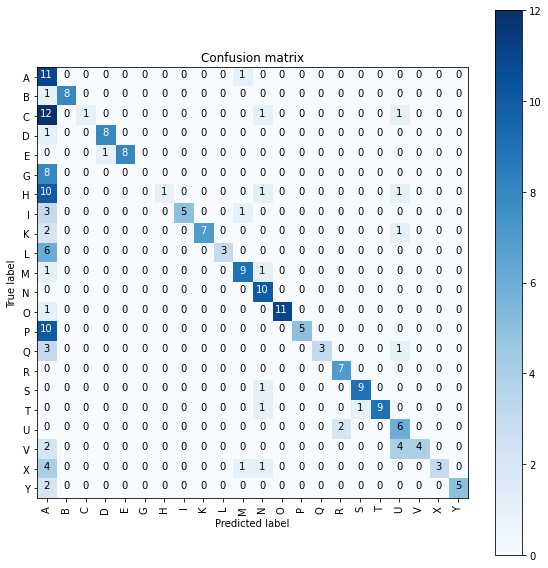

In [110]:
confusion_mtx = confusion_matrix(testLabels, predictions) 
plot_confusion_matrix(confusion_mtx, classes = le.classes_)

Hiệu quả dự đoán được tăng, f1-score tăng từ: 0.4 lên 0.6.

### **2. LOGISTIC REGRESSION**

####**2.1 one-vs-rest (OvR)**


In [116]:
training_accuracy = []
test_accuracy = []

C = np.arange(0.001, 200.001, 50)

for cc in C:
  ovr = LogisticRegression(multi_class='ovr', C=cc,solver='liblinear').fit(trainData, trainLabels)

  # Record
  training_accuracy.append(ovr.score(trainData, trainLabels))
  test_accuracy.append(ovr.score(testData, testLabels))
  print(cc)


0.001
50.001
100.001
150.001


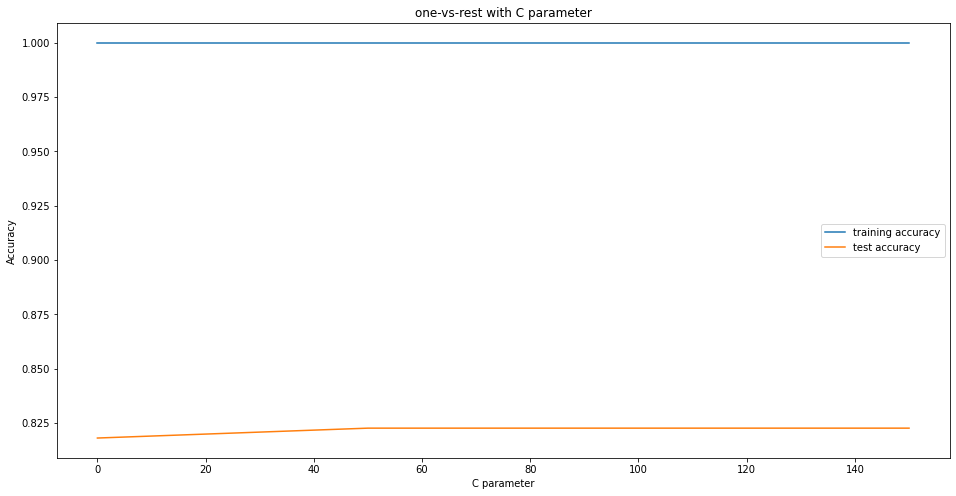

In [117]:
plt.figure(figsize=(16,8))
plt.plot(C, training_accuracy, label="training accuracy")
plt.plot(C, test_accuracy, label="test accuracy")
plt.title("one-vs-rest with C parameter")
plt.ylabel("Accuracy")
plt.xlabel("C parameter")
plt.legend()

In [119]:
C = range(50, 150, 20)
penalty = ['l1', 'l2', 'elasticnet']

ovr_tuning = LogisticRegression(multi_class='ovr' ,solver='liblinear')
grid = dict(C=C, penalty=penalty)
grid_search = GridSearchCV(estimator=ovr_tuning, param_grid=grid, n_jobs=-1, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(trainData, trainLabels)

print("Best OvR model:")
print("Best performance: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Best OvR model:
Best performance: 0.814773 using {'C': 50, 'penalty': 'l2'}


In [121]:
#Best OvR model
ovr = LogisticRegression(C=50, penalty='l2')
ovr.fit(trainData, trainLabels)
predictions = ovr.predict(testData)
print("Accuracy on training set: {}%".format(100*accuracy_score(trainLabels, ovr.predict(trainData))))
print("Accuracy on test set: {}%".format(100*accuracy_score(testLabels, predictions.tolist())))
print(classification_report(testLabels, predictions,
  target_names=le.classes_))

Accuracy on training set: 100.0%
Accuracy on test set: 82.72727272727273%
              precision    recall  f1-score   support

           A       0.53      0.67      0.59        12
           B       0.90      1.00      0.95         9
           C       1.00      0.87      0.93        15
           D       0.90      1.00      0.95         9
           E       1.00      0.89      0.94         9
           G       0.67      0.25      0.36         8
           H       0.73      0.62      0.67        13
           I       0.71      0.56      0.63         9
           K       1.00      0.90      0.95        10
           L       1.00      1.00      1.00         9
           M       0.60      0.82      0.69        11
           N       0.67      1.00      0.80        10
           O       0.92      1.00      0.96        12
           P       0.79      0.73      0.76        15
           Q       0.80      0.57      0.67         7
           R       0.88      1.00      0.93         7
       

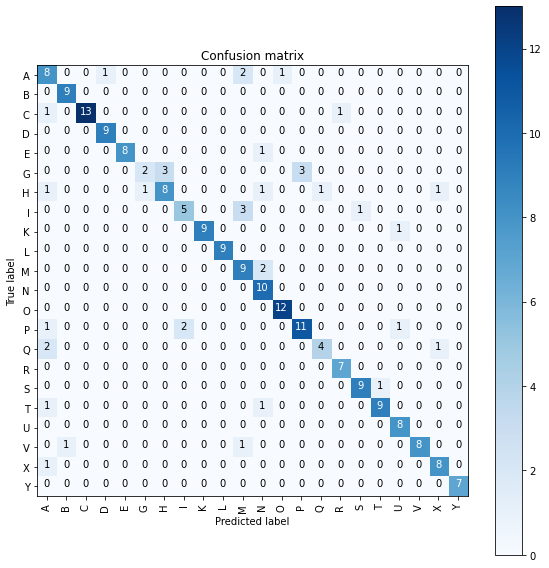

In [122]:
confusion_mtx = confusion_matrix(testLabels, predictions) 
plot_confusion_matrix(confusion_mtx, classes = le.classes_)

Hiệu quả dự đoán được tăng lên một tí, f1-score tăng từ: 0.82 lên 0.83

#### **2.2 Softmax Regression**

In [128]:
training_accuracy = []
test_accuracy = []

C = np.arange(10, 50, 10)

for cc in C:
  sr_tuning = LogisticRegression(multi_class='multinomial', C=cc,solver='lbfgs').fit(trainData, trainLabels)
  # Record
  training_accuracy.append(ovr.score(trainData, trainLabels))
  test_accuracy.append(ovr.score(testData, testLabels))
  print(cc)

10
20
30
40


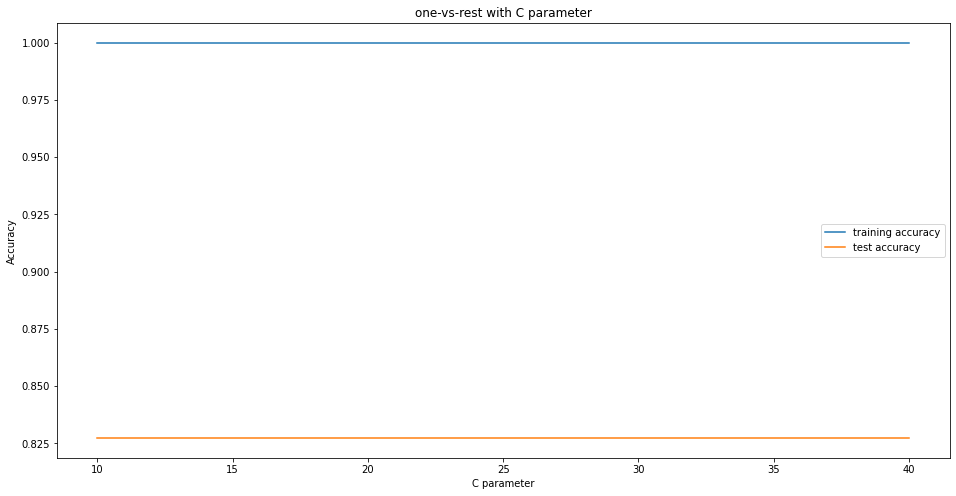

In [129]:
plt.figure(figsize=(16,8))
plt.plot(C, training_accuracy, label="training accuracy")
plt.plot(C, test_accuracy, label="test accuracy")
plt.title("Softmax Regression with C parameter")
plt.ylabel("Accuracy")
plt.xlabel("C parameter")
plt.legend()

In [130]:
penalty = ['l1', 'l2', 'elasticnet']
solver = ['newton-cg', 'sag', 'saga','lbfgs']
sf_tuning = LogisticRegression(multi_class='multinomial')
grid = dict(penalty=penalty, solver=solver)
grid_search = GridSearchCV(estimator=sf_tuning, param_grid=grid, n_jobs=-1, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(trainData, trainLabels)

print("Best Softmax Regression model:")
print("Best performance: %f using %s" % (grid_result.best_score_, grid_result.best_params_))

Best Softmax Regression model:
Best performance: 0.812500 using {'penalty': 'l2', 'solver': 'newton-cg'}


In [131]:
#Best Softmax Regression model
sr_best = LogisticRegression(multi_class='multinomial', penalty='l2', solver='newton-cg')
sr_best.fit(trainData, trainLabels)
predictions = sr_best.predict(testData)
print("Accuracy on training set: {}%".format(100*accuracy_score(trainLabels, sr_best.predict(trainData))))
print("Accuracy on test set: {}%".format(100*accuracy_score(testLabels, predictions.tolist())))
print(classification_report(testLabels, predictions,
  target_names=le.classes_))

Accuracy on training set: 100.0%
Accuracy on test set: 82.27272727272728%
              precision    recall  f1-score   support

           A       0.53      0.67      0.59        12
           B       0.90      1.00      0.95         9
           C       1.00      0.87      0.93        15
           D       0.90      1.00      0.95         9
           E       1.00      0.89      0.94         9
           G       0.67      0.25      0.36         8
           H       0.73      0.62      0.67        13
           I       0.71      0.56      0.63         9
           K       0.90      0.90      0.90        10
           L       1.00      1.00      1.00         9
           M       0.60      0.82      0.69        11
           N       0.67      1.00      0.80        10
           O       0.92      1.00      0.96        12
           P       0.79      0.73      0.76        15
           Q       0.80      0.57      0.67         7
           R       0.88      1.00      0.93         7
       

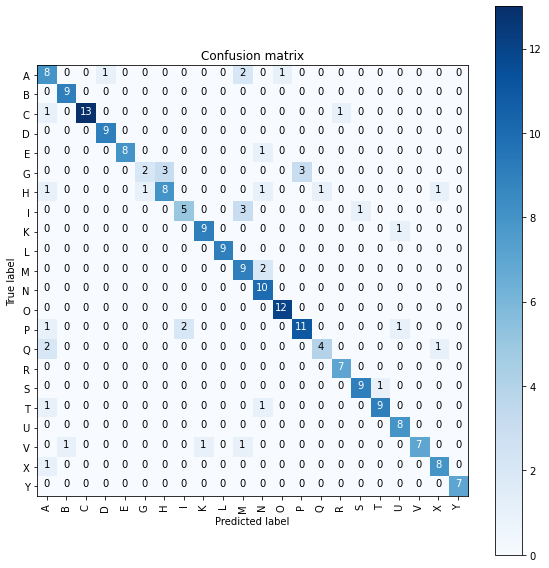

In [132]:
confusion_mtx = confusion_matrix(testLabels, predictions) 
plot_confusion_matrix(confusion_mtx, classes = le.classes_)

Hiệu quả dự đoán sau khi tuning không khác gì nhiều với trước khi tuning

## **Đánh giá**

In [133]:
best_model = LogisticRegression(C=50, penalty='l2')
best_model.fit(trainData, trainLabels)

LogisticRegression(C=50, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

Sau khi xây dựng và kiểm thử với 3 thuật toán (K Nearest-Neighbors, Logistic Regresion với kỹ thuật one-vs-rest, Softmax Regression), thuật toán tốt nhất là Logistic Regresion với kỹ thuật one-vs-rest với f1-score = 0.83. 

Bên cạnh đó Softmax Regression cho ra kết quả khá cao f1-score = 0.82. Thấp nhất là K Nearest-Neighbors với f1-score = 0.6

**Save Model**

In [1]:
filename = '/content/drive/My Drive/ML/models/final_model.sav'


In [ ]:
# save model
pickle.dump(best_model, open(filename, 'wb'))

## **Dự đoán trên bộ dữ liệu mới**
- Bộ dữ liệu [mới](https://drive.google.com/drive/folders/1gMaYtXdFYUH5XTROFvnXIOWhhwDOClyz?usp=sharing) bao gồm 5 ảnh cho mỗi ký tự, mỗi ảnh khác nhau về góc chụp, cường độ sáng, hình dáng ký tự,...
- Tổng số hình ảnh trong bộ dữ liệu là 5 x 22 = 110 ảnh.

In [7]:
test_dir = "/content/drive/My Drive/ML/dataset/test"

### **1. Load hình ảnh và tiền xử lý hình ảnh**

In [42]:
def processImage(img_dir, thresh_hold, debug=False, isSaved=False):
  list_images = []
  labels_image = []
  for label in os.listdir(img_dir):
    # if (label in ['A','B','C','D','E','G','H','M','N','L','I','P']):
    #   continue
    class_dir = img_dir + '/' + label
    index = 0
    for img_name in os.listdir(class_dir):
      img_path = class_dir + '/' + img_name
      origin_image = cv2.imread(img_path)
      image = origin_image.copy()
      image_copy = image.copy()
      # Get bounding box of the largest countour
      countourBox, binary = getLargestContourBox(image, thresh_hold)
      # Crop image from bounding box to get necessary information
      img_croped = four_point_transform(image, countourBox)
      img_croped_resize = cv2.resize(img_croped, (IMG_HEIGHT, IMG_WEIGHT))
      cv2.drawContours(image_copy, [countourBox], -1, (0, 255, 0), 2)
      list_images.append(img_croped_resize)
      labels_image.append(label)
      #Show crop image
      if (debug and index == 2):
        plt.figure(figsize=(20, 8))
        plt.subplot(151)
        plt.title('Origin image')
        plt.imshow(image)
        plt.axis('off')
        plt.subplot(152)
        plt.title('Binary image')
        plt.imshow(binary, 'gray')
        plt.axis('off')
        plt.subplot(153)
        plt.title('Contour image')
        plt.imshow(image_copy)
        plt.axis('off')
        plt.subplot(154)
        plt.title('Croped image')
        plt.imshow(img_croped)
        plt.axis('off')
        plt.subplot(155)
        plt.title('Resize Croped image')
        plt.imshow(img_croped_resize)
        plt.axis('off')
        plt.show()
        index += 1
      if (isSaved):
        img_file_name = label + '_' + str(index) + '.jpg'
        img_path_saved = cropedImg_dir + '/' + label + '/' + img_file_name
        flag = cv2.imwrite(img_path_saved, img_croped) 
        if flag:
          print('Saved:' + img_path_saved)  
      index += 1
  return (list_images, labels_image)

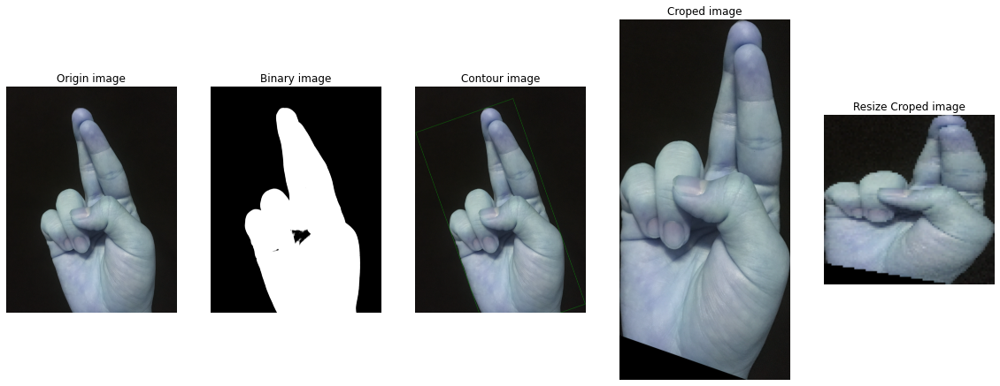

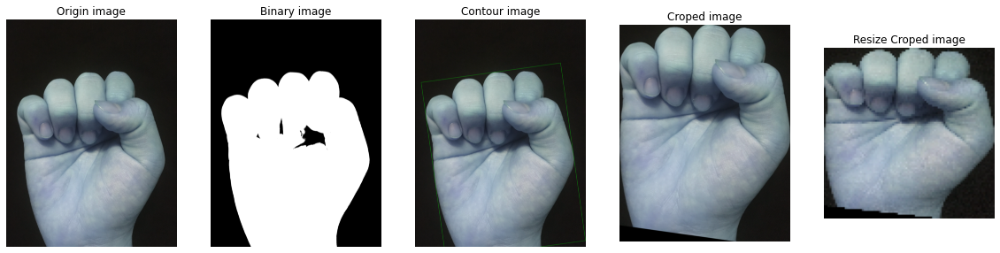

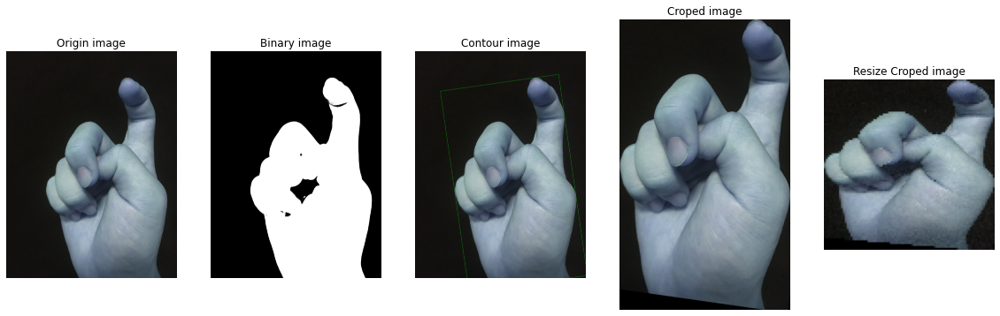

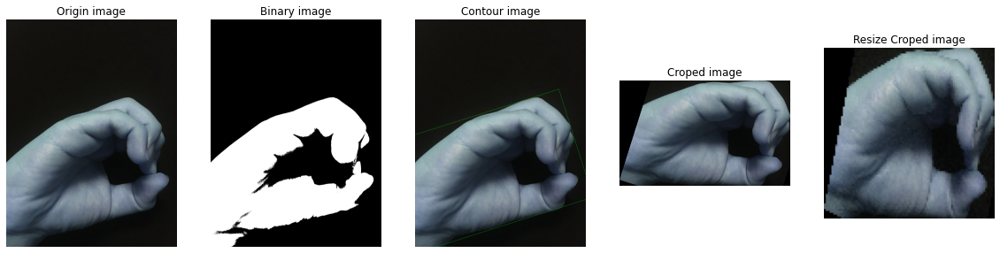

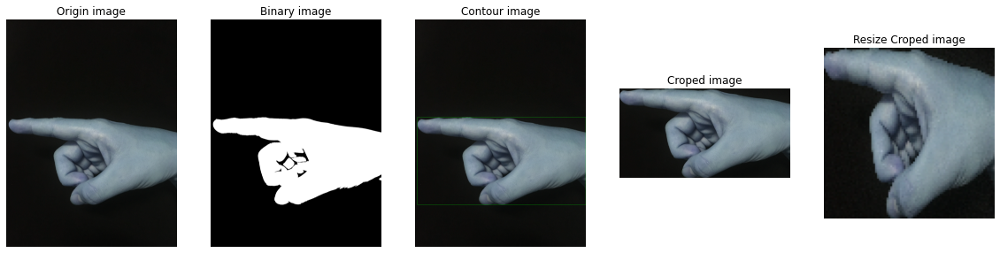

...

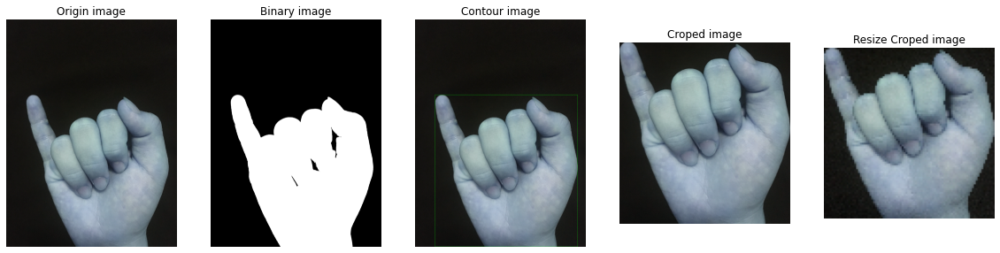

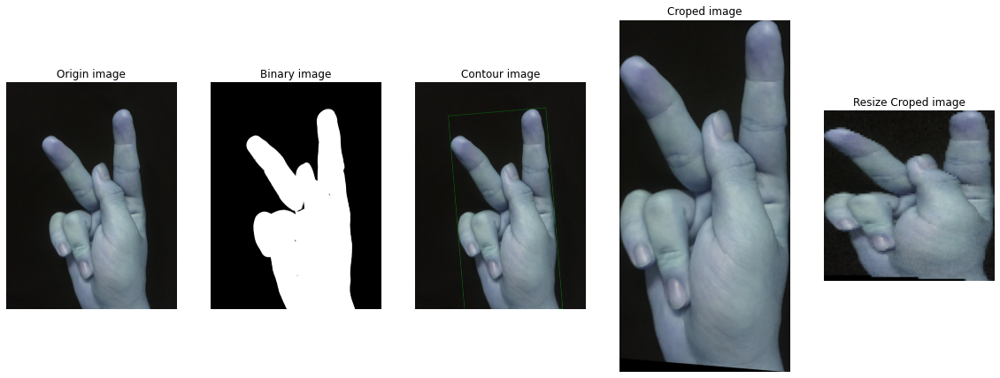

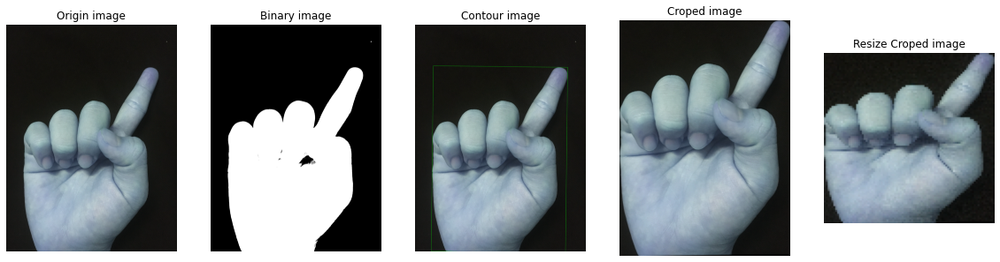

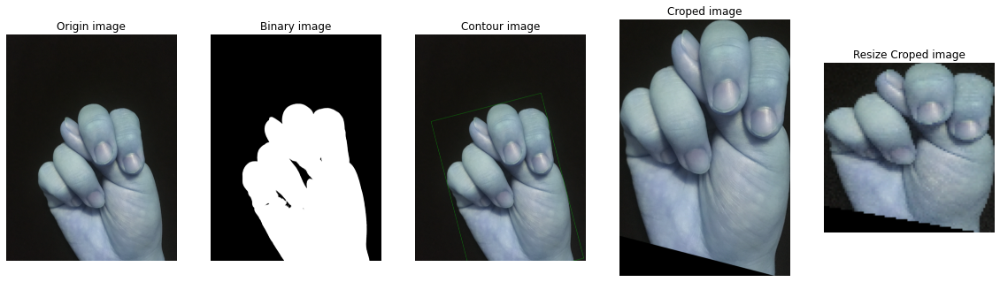

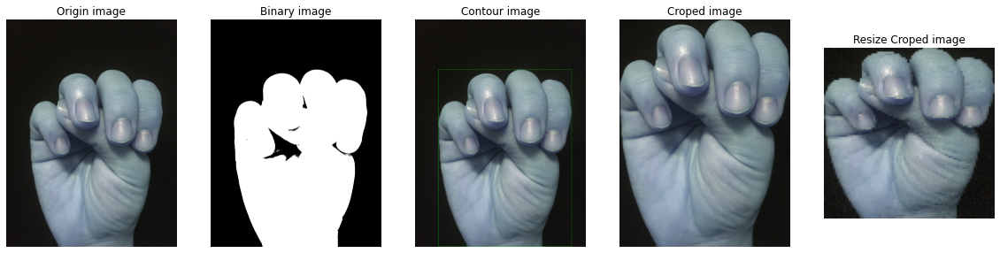

In [43]:
(data_test, labels_test) = processImage(test_dir, 50, True, False)

### **2. Xây dựng đặc trưng**

In [44]:
print(len(data_test))
print(len(labels_test))

110
110


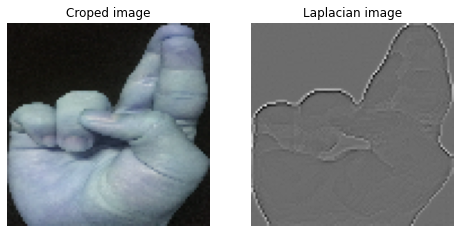

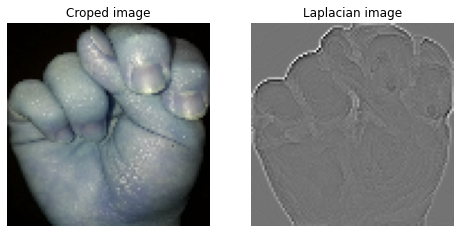

In [45]:
features_test = getFeatureVector(data_test, 'edge', True)

In [46]:
print(len(features_test))
print(features_test[0].shape)

110
(8100,)


In [47]:
le_test = LabelEncoder()
labels_test_tranform = le_test.fit_transform(labels_test)

### **3. Load model**

In [48]:
# load model
loaded_model = pickle.load(open(filename, 'rb'))
predictions_test = loaded_model.predict(features_test)
print("Accuracy: {}%".format(100*accuracy_score(labels_test_tranform, predictions_test.tolist())))
print(classification_report(labels_test_tranform, predictions_test,
  target_names=le_test.classes_))

Accuracy: 20.909090909090907%
              precision    recall  f1-score   support

           A       0.00      0.00      0.00         5
           B       0.00      0.00      0.00         5
           C       0.33      0.60      0.43         5
           D       0.22      0.40      0.29         5
           E       0.20      0.40      0.27         5
           G       0.00      0.00      0.00         5
           H       1.00      0.20      0.33         5
           I       0.25      0.40      0.31         5
           K       0.00      0.00      0.00         5
           L       1.00      0.20      0.33         5
           M       0.07      0.20      0.11         5
           N       0.20      0.40      0.27         5
           O       0.00      0.00      0.00         5
           P       0.00      0.00      0.00         5
           Q       0.00      0.00      0.00         5
           R       0.00      0.00      0.00         5
           S       0.50      0.20      0.29        

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


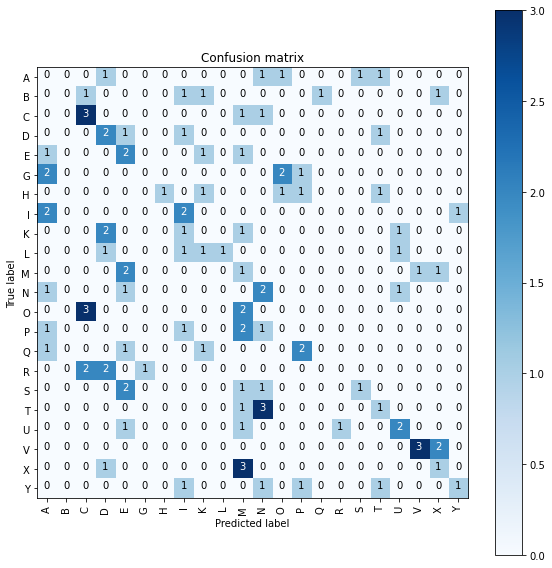

In [53]:
confusion_mtx = confusion_matrix(labels_test_tranform, predictions_test) 
plot_confusion_matrix(confusion_mtx, classes = le_test.classes_)

f1-score rất thấp: 0.2 => Overfitting

## **Kết luận**
- Bài toán đạt được kết quả dự đoán f1-score = 0.82 trên tập train và f1-score = 0.2 trên tập dữ liệu mới.

- Bài toán xuất hiện overfitting, nguyên nhân có thể là do bộ dữ liệu train không đa dạng về điều kiện môi trường hình ảnh. Một nguyên nhân có thể xem xét là các đặc trưng lựa chọn không hợp lí. Cũng có thể model không đáp ứng được các đặc trưng lựa chọn.

- Để nâng cao kết quả dự đoán:
  - Cần đa dạng về tập dữ liệu train, về điều kiện ánh sáng, hình dạng, góc độ, background,...
  - Lựa chọn đặc trưng hợp lí, (bất biến đối với mọi điều kiện).
  - Model phù hợp với đặc trưng đã chọn hoặc các model có thể tự rút trích đặc trưng như CNN, VGG16, ...